In [ ]:
!pip install mahotas


In [ ]:
!pip install skillsnetwork

In [ ]:
import mahotas as mh
import seaborn as sns
from matplotlib import pyplot as plt
import numpy as np
import pandas as pd

from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler

#Classifiers
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.gaussian_process import GaussianProcessClassifier
from sklearn.gaussian_process.kernels import RBF
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, AdaBoostClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.discriminant_analysis import QuadraticDiscriminantAnalysis
from sklearn.neural_network import MLPClassifier
from sklearn.metrics import ConfusionMatrixDisplay

In [ ]:
import skillsnetwork

await skillsnetwork.prepare("https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-GPXX0UEREN/hiroshima-lemon.zip", overwrite=True)

  0%|          | 0/5515 [00:00<?, ?it/s]

Saved to '.'


In [13]:
def get_data(folder, file):
    plt.rcParams["axes.grid"] = False
    data = []
    images = []  # Separate list to store images
    labels = []  # Separate list to store labels
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv') # Form a DataSet from a csv
    print(ds)
    i = 0
    r = 0
    for im, c in ds.values:
        if i==0 and r < 50:
            fig = plt.figure(figsize = (20,20)) # Display an image
        image = mh.imread(folder + '/' + file + '/' + im) #Download an image
        images.append(image)  # Append image to the images list
        labels.append(c)  # Append label to the labels list
        if r < 50:
            plt.subplot(1, 5, i+1) # Create a table of images
            plt.imshow(image)
        i += 1
        if i==5:
            i = 0
        r += 1
    plt.show()

    return np.array(images), np.array(labels)  # Return images and labels as separate arrays

hiroshima-lemon/train_images
                  id  class_num
0     train_0000.jpg          0
1     train_0001.jpg          0
2     train_0002.jpg          0
3     train_0003.jpg          0
4     train_0004.jpg          0
...              ...        ...
1097  train_1097.jpg          1
1098  train_1098.jpg          0
1099  train_1099.jpg          1
1100  train_1100.jpg          2
1101  train_1101.jpg          0

[1102 rows x 2 columns]


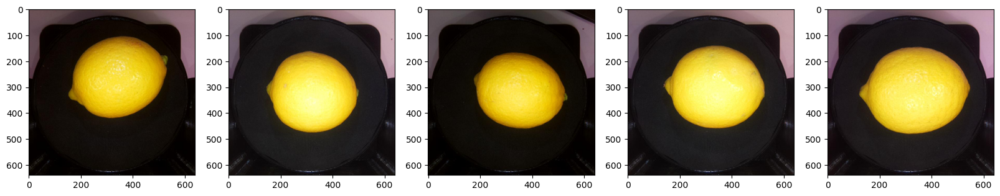

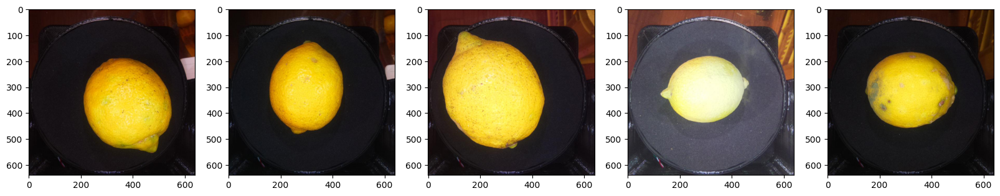

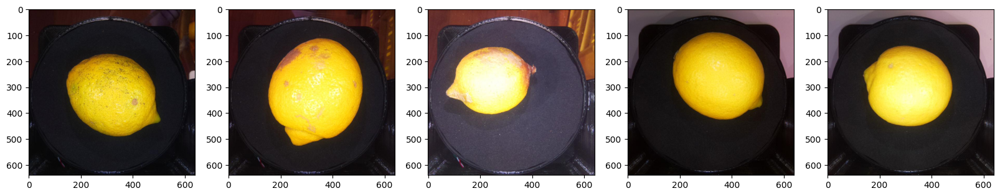

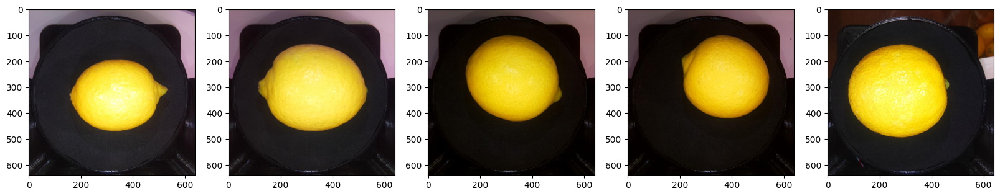

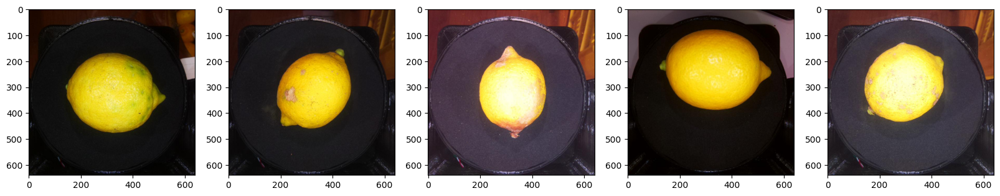

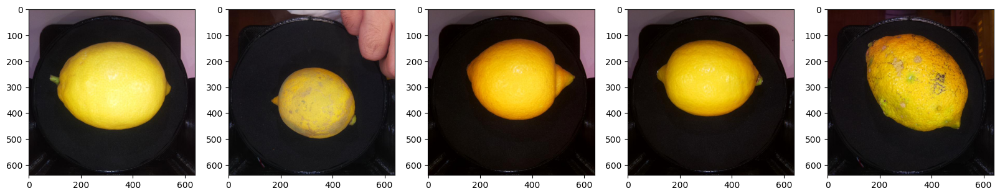

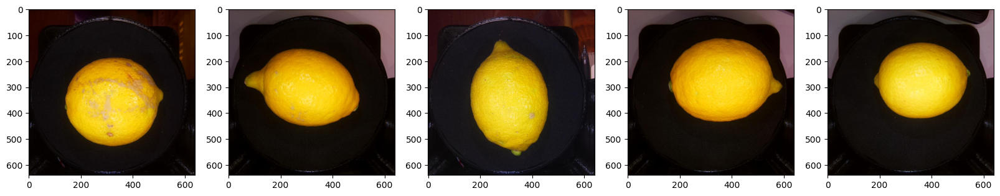

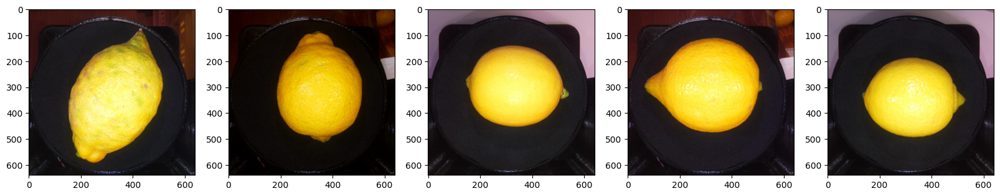

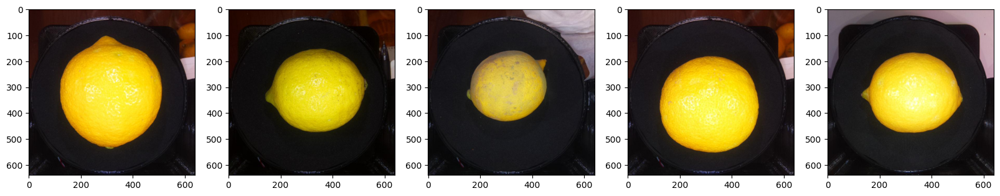

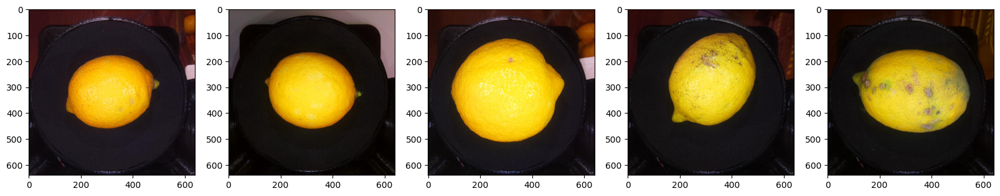

In [14]:
d = "hiroshima-lemon"
f = "train_images"
train = get_data(d, f)

<Axes: xlabel='Class', ylabel='count'>

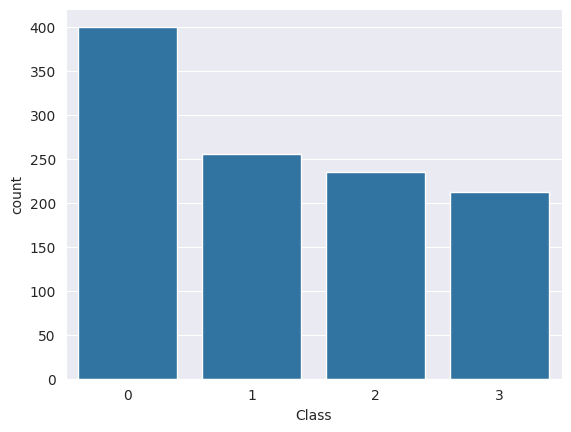

In [16]:
# Access the second element of the tuple (labels) using an integer index
c = pd.DataFrame(train[1])
c.columns = ['Class']
sns.set_style('darkgrid')
sns.countplot(x="Class", data=c)

In [17]:
class_names = {0: 'excellent', 1: 'good', 2: 'processed products', 3: 'disqualified'}

In [19]:
# sklearn function
from sklearn.model_selection import train_test_split

# Access the image and label arrays within the 'train' tuple
images = train[0]
labels = train[1]

# Split the data into training and validation sets
im_train, im_val, c_train, c_val = train_test_split(images, labels, test_size=0.3, shuffle=True)
c_train = c_train.astype('int')
c_val = c_val.astype('int')

In [20]:
print("Train shape", im_train.shape) # Size of the training DataSet
print("Test shape", im_val.shape) # Size of the test DataSet

Train shape (771, 640, 640, 3)
Test shape (331, 640, 640, 3)


<Axes: xlabel='Train Class Name', ylabel='count'>

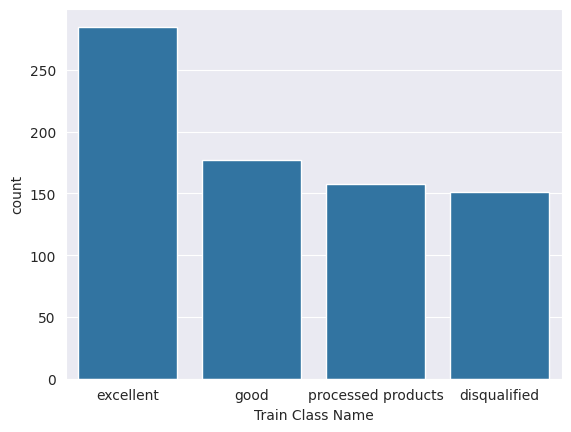

In [21]:
c = pd.DataFrame(c_train)
c.columns = ['Train Class']
c['Train Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x="Train Class Name", data=c, order = ['excellent', 'good', 'processed products', 'disqualified'])

<Axes: xlabel='Validate Class Name', ylabel='count'>

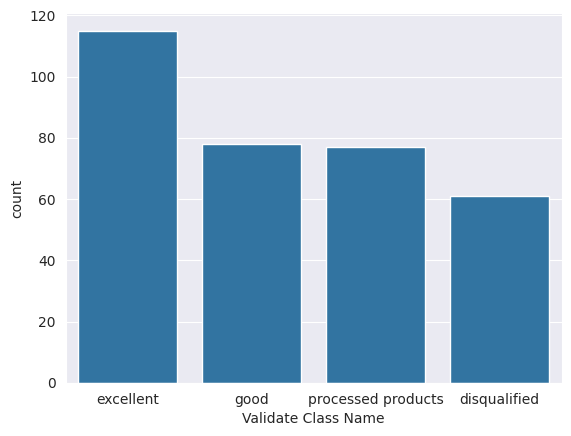

In [22]:
c = pd.DataFrame(c_val)
c.columns = ['Train Class']
c['Validate Class Name'] = c['Train Class'].map(class_names)
sns.set_style('darkgrid')
sns.countplot(x="Validate Class Name", data=c, order = ['excellent', 'good', 'processed products', 'disqualified'])

Quality of lemon
excellent


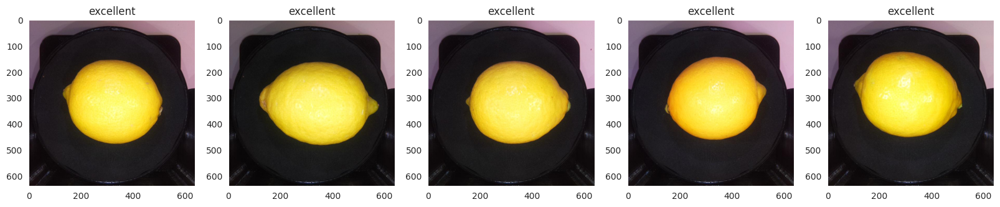

good


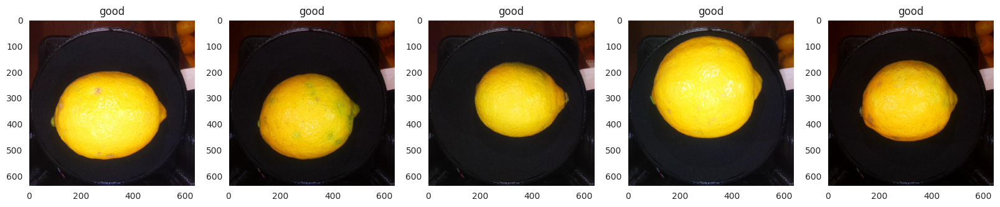

processed products


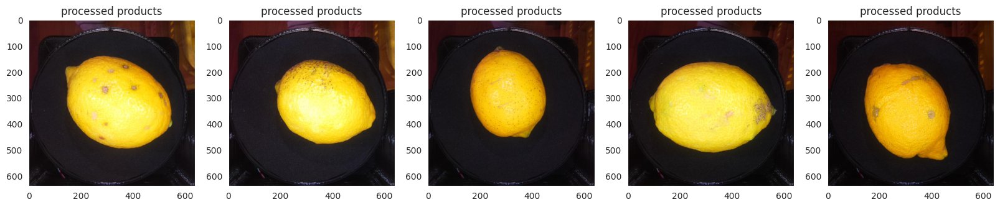

disqualified


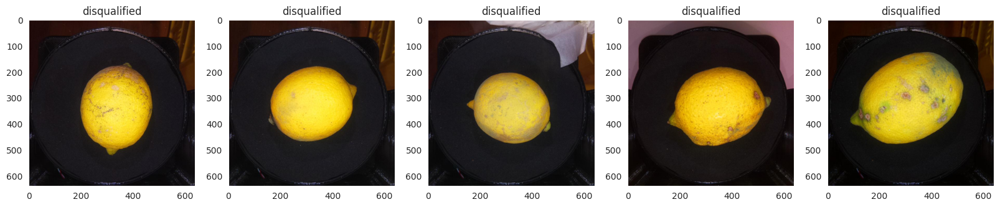

In [23]:
print("Quality of lemon")
plt.rcParams["axes.grid"] = False
for c in class_names:
    ims = np.where(c_train == c)[0][:5]
    print(class_names[c])
    fig = plt.figure(figsize = (20,20))
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i+1) #create a table of images
        plt.imshow(im_train[im])
        plt.title(class_names[c])
    plt.show()


In [24]:
def create_features(im):
    features = []
    for image in im:
        im_grey = mh.colors.rgb2grey(image, dtype = np.uint8)
        features.append(mh.features.haralick(im_grey).ravel())
    features = np.array(features)
    return (features)

In [25]:
features_train = create_features(im_train)
features_val = create_features(im_val)

In [26]:
print(features_train.shape)
print(features_val.shape)

(771, 52)
(331, 52)


Training DataSet accuracy:  92.3% Test DataSet accuracy:  91.8%


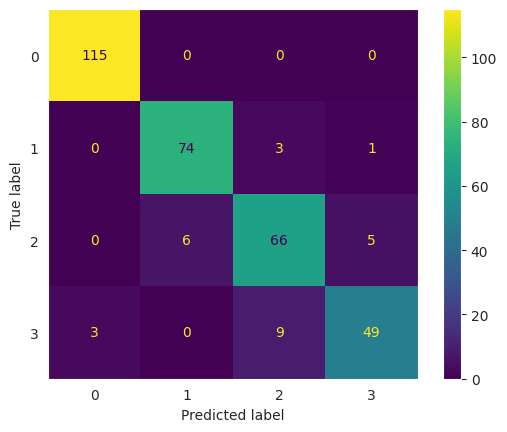

In [27]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression(max_iter=1000))])
clf.fit(features_train, c_train)
scores_train = clf.score(features_train, c_train)
scores_val = clf.score(features_val, c_val)
print('Training DataSet accuracy: {: .1%}'.format(scores_train), 'Test DataSet accuracy: {: .1%}'.format(scores_val))
ConfusionMatrixDisplay.from_estimator(clf, features_val, c_val)
plt.show()

In [28]:
names = ["Logistic Regression", "Nearest Neighbors", "Linear SVM", "RBF SVM", "Gaussian Process",
         "Decision Tree", "Random Forest", "Neural Net", "AdaBoost",
         "Naive Bayes", "QDA"]

classifiers = [
    LogisticRegression(max_iter=1000),
    KNeighborsClassifier(3),
    SVC(kernel="linear", C=0.025),
    SVC(gamma=2, C=1),
    GaussianProcessClassifier(1.0 * RBF(1.0)),
    DecisionTreeClassifier(max_depth=5),
    RandomForestClassifier(max_depth=5, n_estimators=10, max_features=1),
    MLPClassifier(alpha=1, max_iter=1000),
    AdaBoostClassifier(),
    GaussianNB(),
    QuadraticDiscriminantAnalysis()]
scores_train = []
scores_val = []
for name, clf in zip(names, classifiers):
    print("Fitting:", name)
    clf = Pipeline([('preproc', StandardScaler()), ('classifier', clf)])
    clf.fit(features_train, c_train)
    score_train = clf.score(features_train, c_train)
    score_val = clf.score(features_val, c_val)
    scores_train.append(score_train)
    scores_val.append(score_val)

Fitting: Logistic Regression
Fitting: Nearest Neighbors
Fitting: Linear SVM
Fitting: RBF SVM
Fitting: Gaussian Process


/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/gaussian_process/kernels.py:452: ConvergenceWarning: The optimal value found for dimension 0 of parameter k1__constant_value is close to the specified upper bound 100000.0. Increasing the bound and calling fit again may find a better value.
  warnings.warn(


Fitting: Decision Tree
Fitting: Random Forest
Fitting: Neural Net
Fitting: AdaBoost
Fitting: Naive Bayes
Fitting: QDA


/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 0 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 1 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 2 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/discriminant_analysis.py:1024: LinAlgWarning: The covariance matrix of class 3 is not full rank. Increasing the value of parameter `reg_param` might help reducing the collinearity.
  warnings.warn(


In [29]:
res = pd.DataFrame(index = names)
res['scores_train'] = scores_train
res['scores_val'] = scores_val
res.columns = ['Test','Validate']
res.index.name = "Classifier accuracy"
pd.options.display.float_format = '{:,.2f}'.format
print(res)

                     Test  Validate
Classifier accuracy                
Logistic Regression  0.92      0.92
Nearest Neighbors    0.92      0.85
Linear SVM           0.79      0.76
RBF SVM              1.00      0.88
Gaussian Process     1.00      0.97
Decision Tree        0.82      0.79
Random Forest        0.85      0.77
Neural Net           0.96      0.94
AdaBoost             0.76      0.73
Naive Bayes          0.69      0.69
QDA                  1.00      0.98


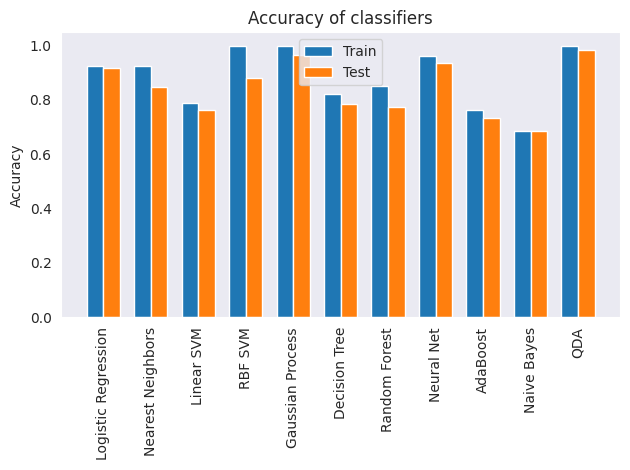

In [30]:
x = np.arange(len(names))  # the label locations
width = 0.35  # the width of the bars

fig, ax = plt.subplots()
rects1 = ax.bar(x - width/2, scores_train, width, label='Train')
rects2 = ax.bar(x + width/2, scores_val, width, label='Test')

# Add some text for labels, title and custom x-axis tick labels, etc.
ax.set_ylabel('Accuracy')
ax.set_title('Accuracy of classifiers')
ax.set_xticks(x)
plt.xticks(rotation = 90)
ax.set_xticklabels(names)
ax.legend()

fig.tight_layout()

plt.show()

In [31]:
def get_test_data(folder, file):
    data = []
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    for im in ds.values:
        image = mh.imread(folder + '/' + file + '/' + im[0])
        data.append(image)
    return np.array(data)

In [32]:
d = "hiroshima-lemon"
f = "test_images"
test = get_test_data(d, f)

hiroshima-lemon/test_images


In [33]:
features_test = create_features(test)


In [34]:
print(test.shape)
print(features_test.shape)

(1651, 640, 640, 3)
(1651, 52)


In [35]:
clf = Pipeline([('preproc', StandardScaler()), ('classifier', LogisticRegression(max_iter=1000))])
clf.fit(features_train, c_train)

Pipeline(steps=[('preproc', StandardScaler()),
                ('classifier', LogisticRegression(max_iter=1000))])

In [36]:
c_test = clf.predict(features_test)
c_test

array([0, 3, 0, ..., 3, 0, 0])

Classification results
excellent


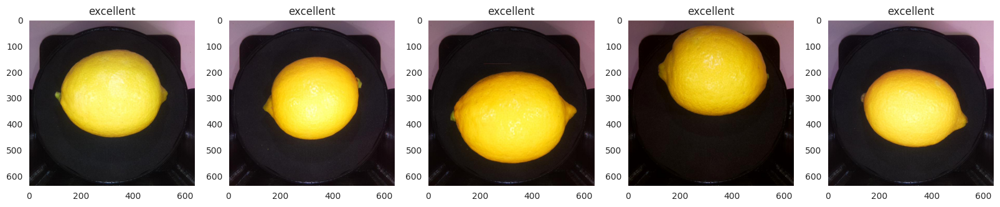

good


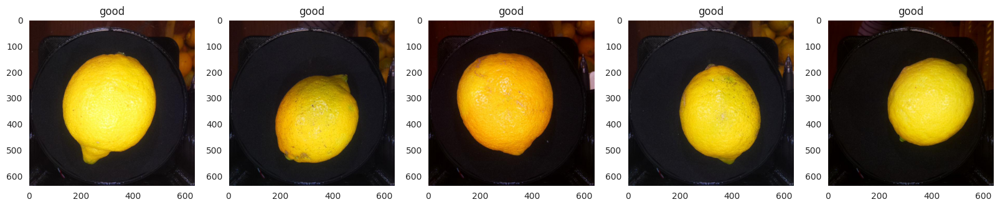

processed products


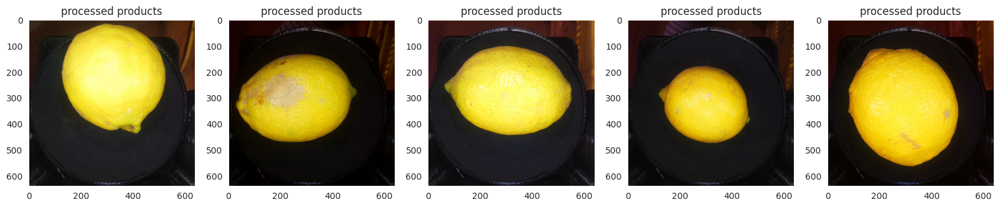

disqualified


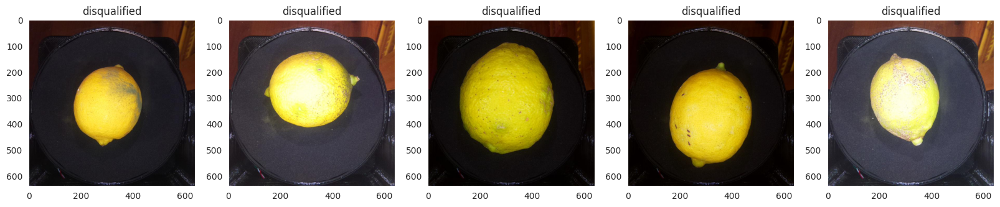

In [37]:
print("Classification results")
for c in class_names:
    ims = np.where(c_test == c)[0][:5]
    print(class_names[c])
    fig = plt.figure(figsize = (20,20))
    for i, im in enumerate(ims):
        plt.subplot(1, 5, i+1) #create table of images
        plt.imshow(test[im])
        plt.title(class_names[c])
    plt.show()

In [38]:
def safe_test_result(folder, file, res):
    print(folder + '/' + file)
    ds = pd.read_csv(folder + '/' + file + '.csv')
    ds['Class'] = res
    print(ds)
    ds.to_csv('results.csv', index=False)
    return

In [39]:
d = "hiroshima-lemon"
f = "test_images"
safe_test_result(d, f, c_test)

hiroshima-lemon/test_images
                 id  Class
0     test_0000.jpg      0
1     test_0001.jpg      3
2     test_0002.jpg      0
3     test_0003.jpg      3
4     test_0004.jpg      0
...             ...    ...
1646  test_1646.jpg      3
1647  test_1647.jpg      2
1648  test_1648.jpg      3
1649  test_1649.jpg      0
1650  test_1650.jpg      0

[1651 rows x 2 columns]
